In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
%mkdir project

mkdir: cannot create directory ‘project’: File exists


In [ ]:
!git clone https://github.com/IDEA-Research/GroundingDINO.git

fatal: destination path 'GroundingDINO' already exists and is not an empty directory.


In [ ]:
%cd GroundingDINO/
!pip install -q -e .
%mkdir weights
# !wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content/drive/MyDrive/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 59.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.9/200.9 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 97.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 79.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 107.4 MB/s eta 0:00:00
mkdir: cannot create directory ‘weights’: File exists


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:866: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/u

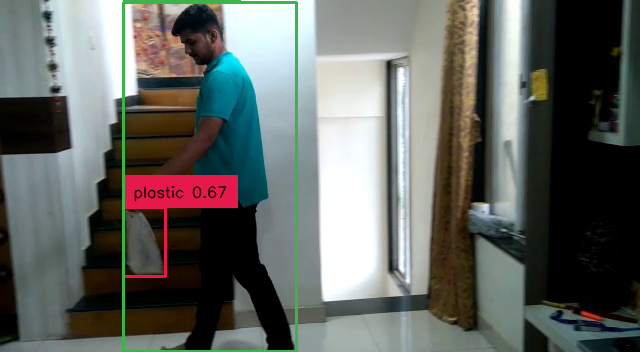

In [ ]:
from groundingdino.util.inference import load_model, load_image, predict, annotate
from google.colab.patches import cv2_imshow
import cv2

model = load_model("/content/drive/MyDrive/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "/content/drive/MyDrive/GroundingDINO/groundingdino_swint_ogc.pth")
# IMAGE_PATH = "/content/drive/MyDrive/frame2.jpg"
IMAGE_PATH = "/content/frame85.jpg"
TEXT_PROMPT = "human . plastic ."
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
cv2_imshow(annotated_frame)

In [ ]:
from groundingdino.util.inference import load_model, load_image, predict, annotate
import glob
import os
from google.colab.patches import cv2_imshow
import cv2

model = load_model("/content/drive/MyDrive/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "/content/drive/MyDrive/GroundingDINO/groundingdino_swint_ogc.pth")

def FrameCapture(path, output_dir):
    # Path to video file
    vidObj = cv2.VideoCapture(path)

    # Used as counter variable
    count = 0

    # checks whether frames were extracted
    success = 1

    while success:
        # vidObj object calls read function extract frames
        success, image = vidObj.read()
        if(success):
          # Saves the frames with frame-count
          frame_path = os.path.join(output_dir, f'frame{count:04d}.jpg')
          cv2.imwrite(frame_path, image)

          count += 1
        else:
          break

    # Release the video capture object
    vidObj.release()
FrameCapture('/content/drive/MyDrive/test-bottle.mp4','/content/drive/MyDrive/frames')

IMAGE_FOLDER_PATH = '/content/drive/MyDrive/frames'
# Get a list of all JPG files in the folder
jpg_files = glob.glob(IMAGE_FOLDER_PATH + "*.jpg")
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25
for image_path in jpg_files:
    image_source, image = load_image(image_path)

    boxes, logits, phrases = predict(
        model=model,
        image=image,
        caption=TEXT_PROMPT,
        box_threshold=BOX_THRESHOLD,
        text_threshold=TEXT_THRESHOLD
    )

    annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
    cv2_imshow(annotated_frame)
def main():
    print('hello')
main()


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


hello


In [ ]:
from groundingdino.util.inference import load_model, load_image, predict, annotate
import glob
import os
from google.colab.patches import cv2_imshow
import cv2

model = load_model("/content/drive/MyDrive/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "/content/drive/MyDrive/GroundingDINO/groundingdino_swint_ogc.pth")

def FrameCapture(path, output_dir):
    # Path to video file
    vidObj = cv2.VideoCapture(path)

    # Used as counter variable
    count = 0

    # checks whether frames were extracted
    success = 1

    while success:
        # vidObj object calls read function extract frames
        success, image = vidObj.read()
        if success:
            # Saves the frames with frame-count
            frame_path = os.path.join(output_dir, f'frame{count:04d}.jpg')
            cv2.imwrite(frame_path, image)

            count += 1
        else:
            break

    # Release the video capture object
    vidObj.release()

FrameCapture('/content/drive/MyDrive/test-bottle.mp4','/content/drive/MyDrive/frames')

def main():
    IMAGE_FOLDER_PATH = '/content/drive/MyDrive/frames/'
    # Get a list of all JPG files in the folder
    jpg_files = glob.glob(IMAGE_FOLDER_PATH + "*.jpg")
    TEXT_PROMPT = "human . plastic . hand ."
    BOX_THRESHOLD = 0.35
    TEXT_THRESHOLD = 0.25
    for image_path in jpg_files:
        image_source, image = load_image(image_path)

        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
        # cv2_imshow(annotated_frame)
        if "human" in phrases and "plastic" in phrases:
            annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
            cv2_imshow(annotated_frame)
    print('hello')

main()


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


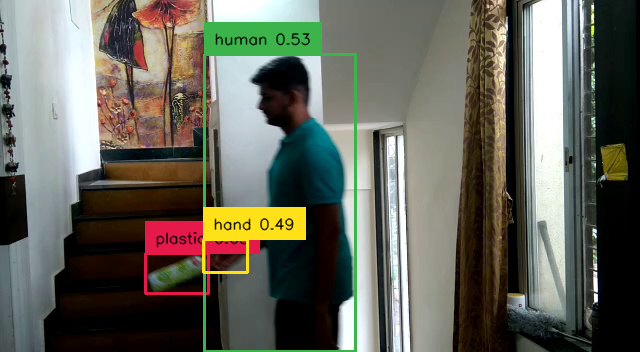

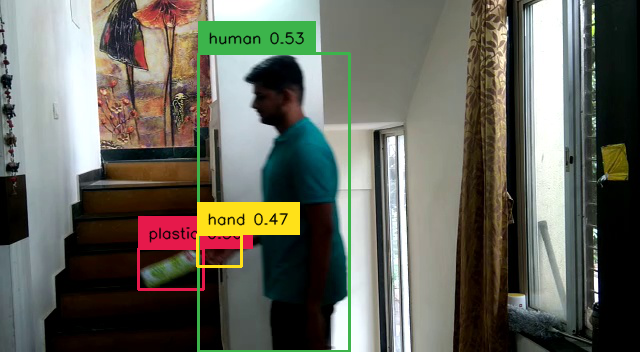

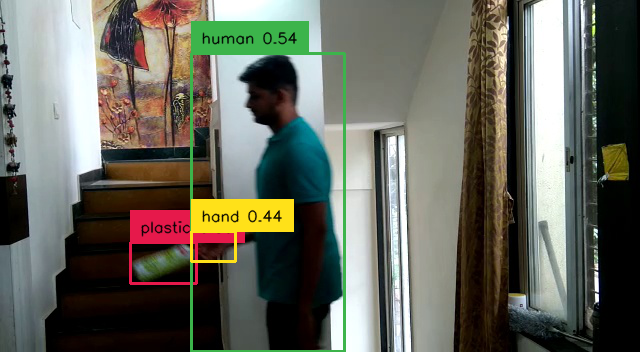

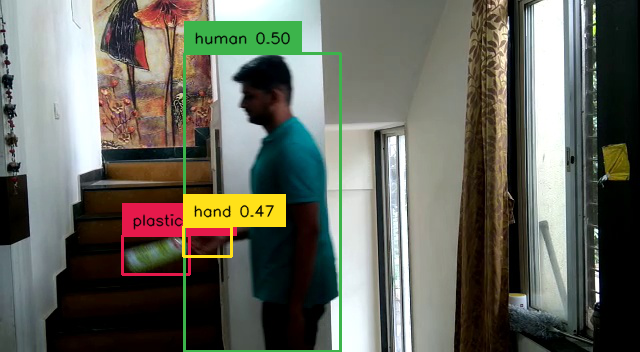

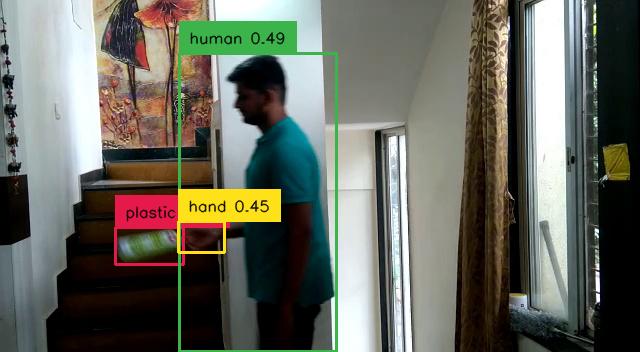

...

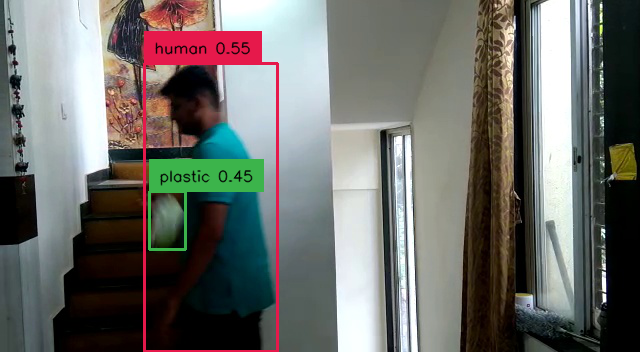

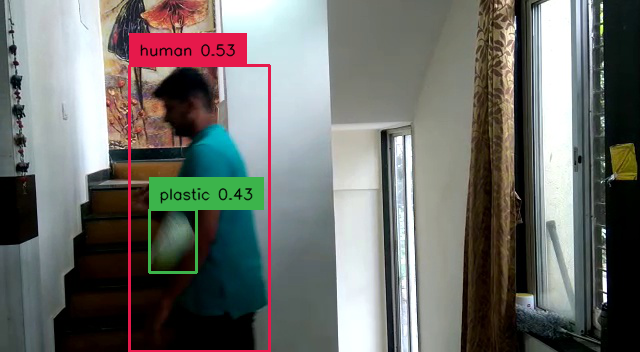

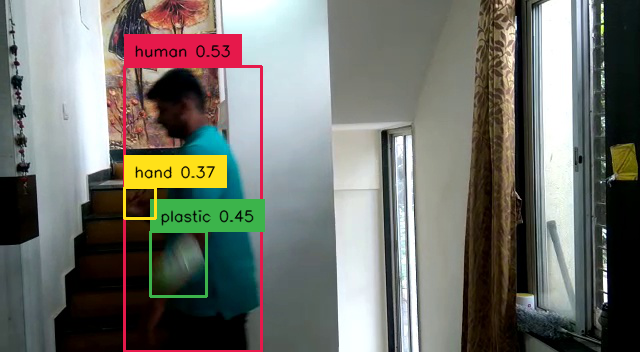

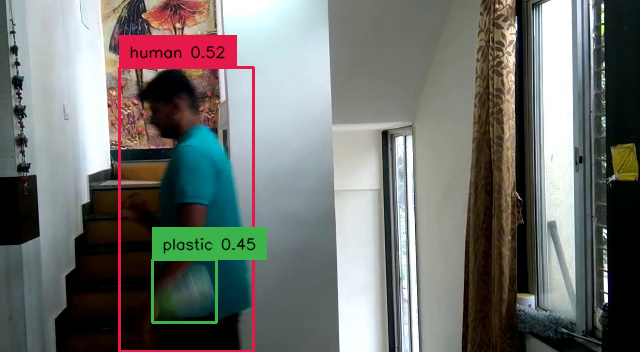

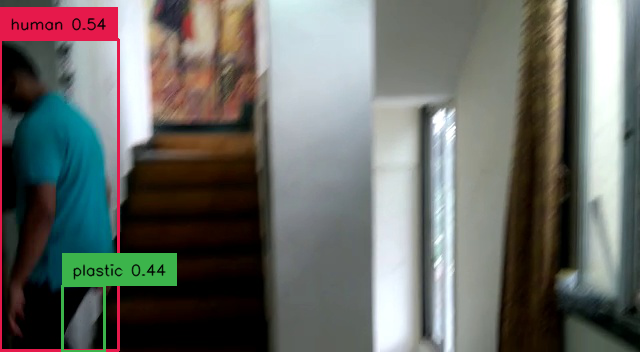

hello


In [ ]:
from groundingdino.util.inference import load_model, load_image, predict, annotate
import glob
import os
from google.colab.patches import cv2_imshow
import cv2

model = load_model("/content/drive/MyDrive/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "/content/drive/MyDrive/GroundingDINO/groundingdino_swint_ogc.pth")

def FrameCapture(path, output_dir):
    # Path to video file
    vidObj = cv2.VideoCapture(path)

    # Used as counter variable
    count = 0

    # checks whether frames were extracted
    success = 1

    while success:
        # vidObj object calls read function extract frames
        success, image = vidObj.read()
        if success:
            # Saves the frames with frame-count
            frame_path = os.path.join(output_dir, f'frame{count:04d}.jpg')
            cv2.imwrite(frame_path, image)

            count += 1
        else:
            break

    # Release the video capture object
    vidObj.release()

FrameCapture('/content/drive/MyDrive/test-bottle.mp4','/content/drive/MyDrive/frames')

def main():
    IMAGE_FOLDER_PATH = '/content/drive/MyDrive/frames/'
    # Get a list of all JPG files in the folder
    jpg_files = glob.glob(IMAGE_FOLDER_PATH + "*.jpg")
    TEXT_PROMPT = "human . plastic . hand ."
    BOX_THRESHOLD = 0.35
    TEXT_THRESHOLD = 0.25
    for image_path in jpg_files:
        image_source, image = load_image(image_path)

        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
        # cv2_imshow(annotated_frame)
        if "human" in phrases and "plastic" in phrases:
            annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
            cv2_imshow(annotated_frame)
    print('hello')

main()


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


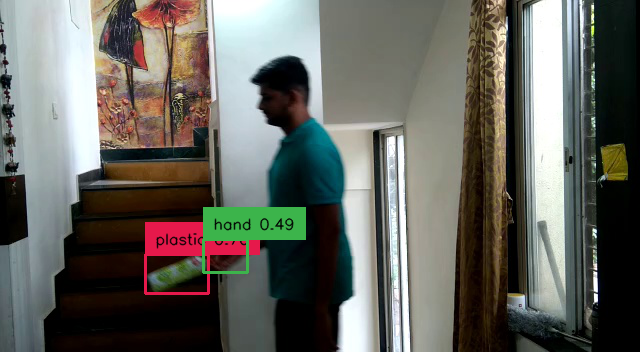

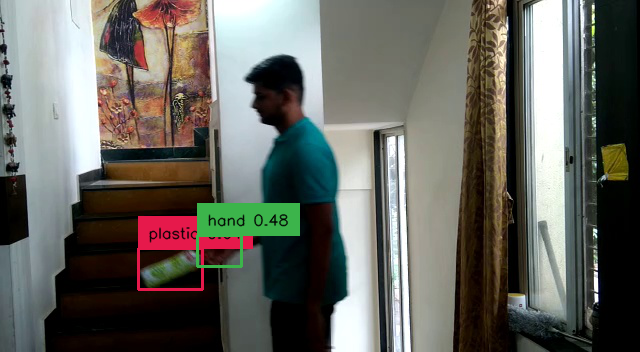

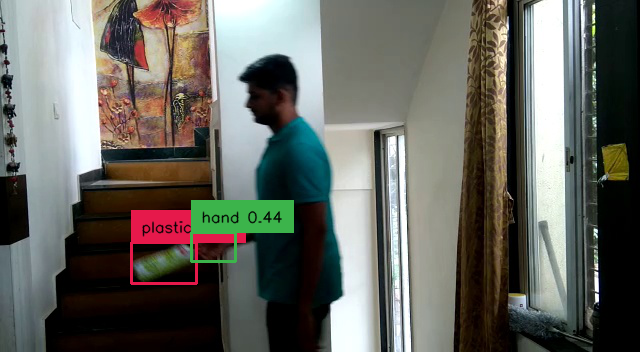

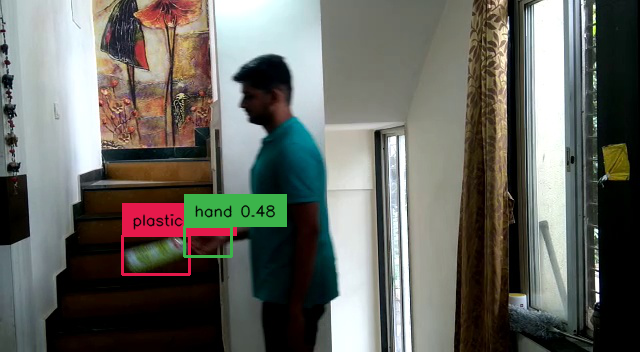

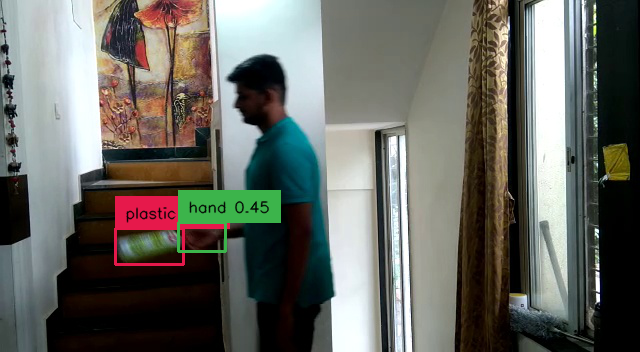

...

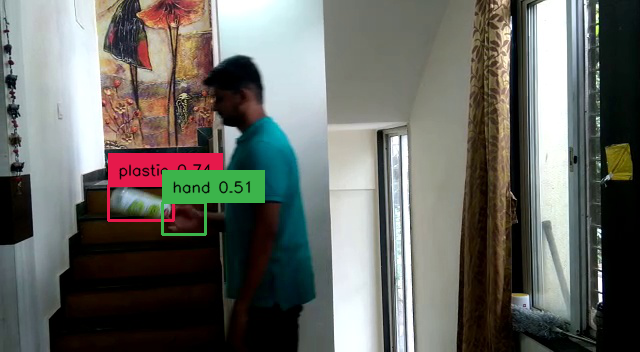

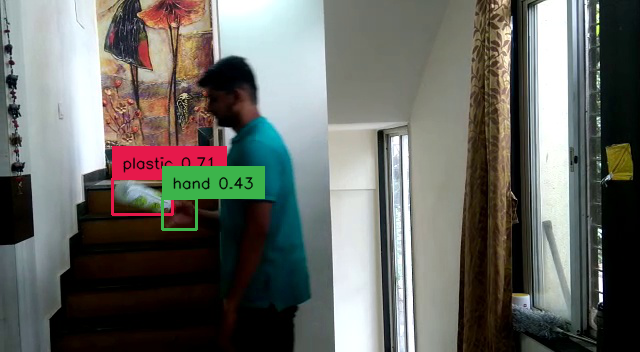

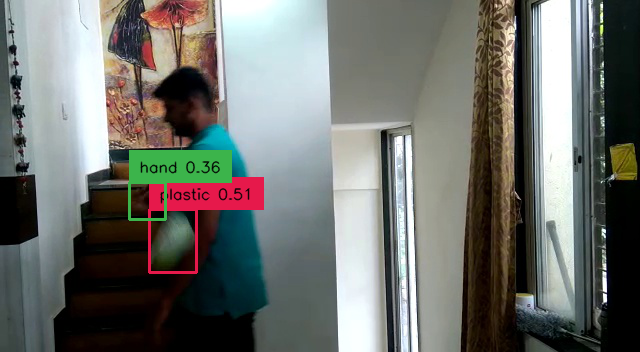

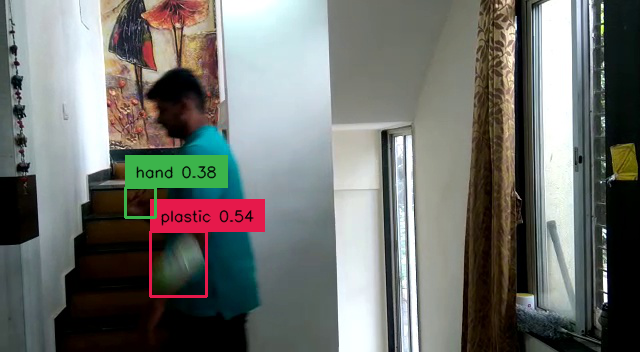

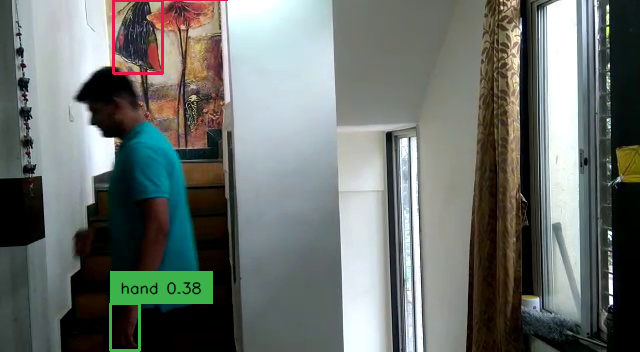

hello


In [ ]:
import cv2
import os
import glob
import math
from groundingdino.util.inference import load_model, load_image, predict, annotate
from google.colab.patches import cv2_imshow

model = load_model("/content/drive/MyDrive/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "/content/drive/MyDrive/GroundingDINO/groundingdino_swint_ogc.pth")

def FrameCapture(path, output_dir):
    # Path to video file
    vidObj = cv2.VideoCapture(path)

    # Used as counter variable
    count = 0

    # checks whether frames were extracted
    success = 1

    while success:
        # vidObj object calls read function extract frames
        success, image = vidObj.read()
        if success:
            # Saves the frames with frame-count
            frame_path = os.path.join(output_dir, f'frame{count:04d}.jpg')
            cv2.imwrite(frame_path, image)

            count += 1
        else:
            break

    # Release the video capture object
    vidObj.release()

def main():
    IMAGE_FOLDER_PATH = '/content/drive/MyDrive/frames/'
    # Get a list of all JPG files in the folder
    jpg_files = glob.glob(IMAGE_FOLDER_PATH + "*.jpg")
    TEXT_PROMPT = "hand . plastic ."
    BOX_THRESHOLD = 0.35
    TEXT_THRESHOLD = 0.25
    for i in range(len(jpg_files)-1):
        image_path = jpg_files[i]
        image_next_path = jpg_files[i+1]
        image_source, image = load_image(image_path)
        image_next_source, image_next = load_image(image_next_path)

        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )
        boxes_next, logits_next, phrases_next = predict(
            model=model,
            image=image_next,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Find the center of the hand and plastic
        hand_center = None
        plastic_center = None
        for box, phrase in zip(boxes, phrases):
            if phrase == "hand":
                hand_center = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
                # print('hand_center',hand_center)
            elif phrase == "plastic":
                plastic_center = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
                # print("plastic_center",plastic_center)

        # Calculate the distance between the hand center and plastic center using the distance formula
        if hand_center is not None and plastic_center is not None:
            distance = math.sqrt((hand_center[0] - plastic_center[0])**2 + (hand_center[1] - plastic_center[1])**2)

            # Check if the distance is greater than a certain threshold
            if distance > 0.2941: # Change this value as needed
                annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
                cv2_imshow(annotated_frame)

    print('hello')

main()


final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


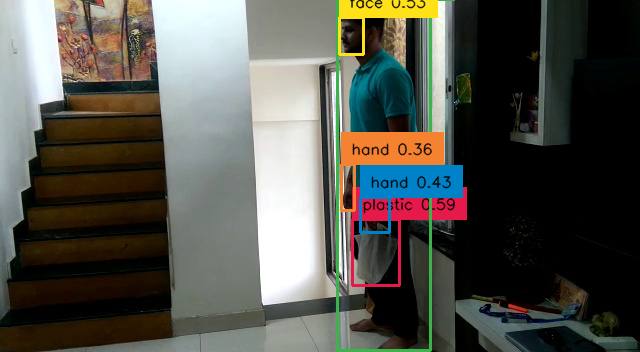

0.12986135664093323


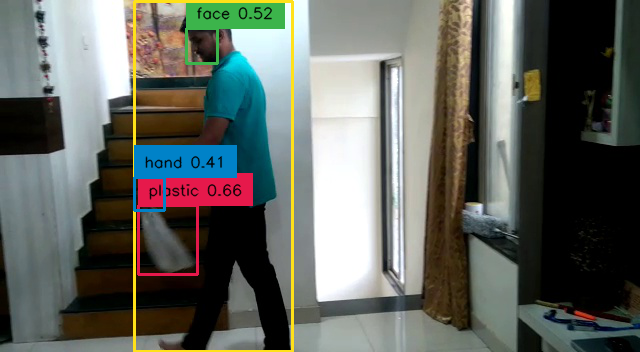

0.12222051915814916


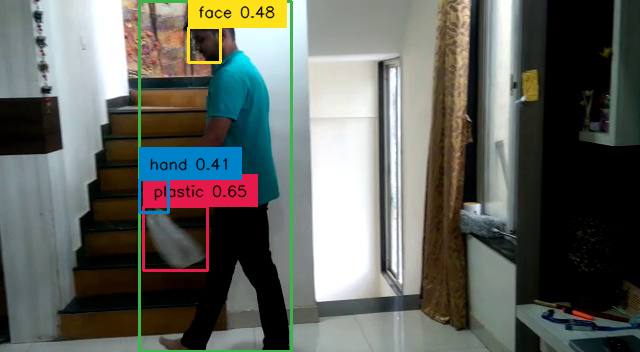

0.11378906147855686


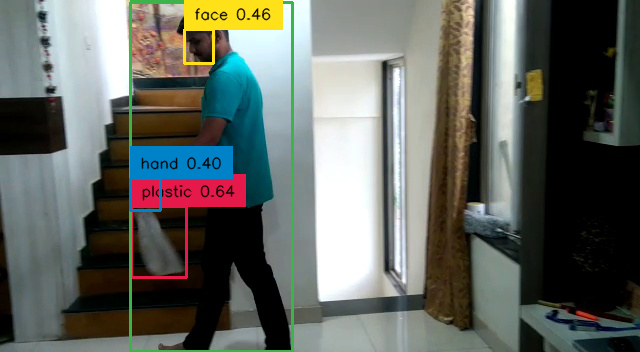

0.12505385609579955


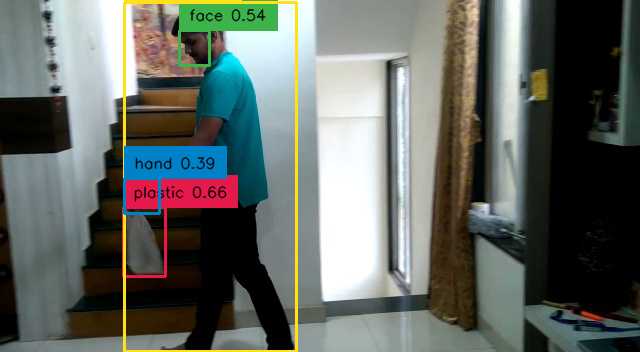

0.11300990063517866


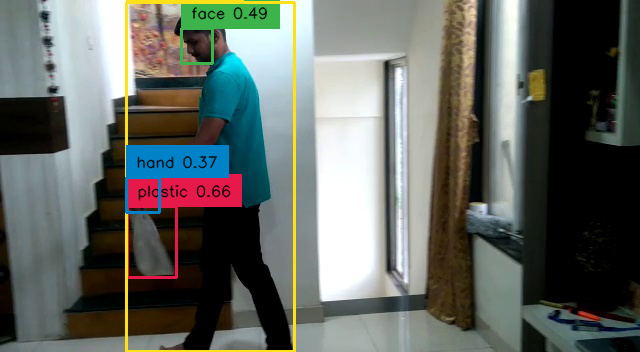

0.11945037755058233


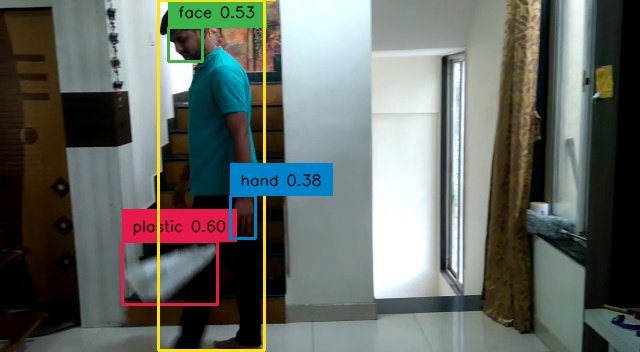

0.10846442284823339


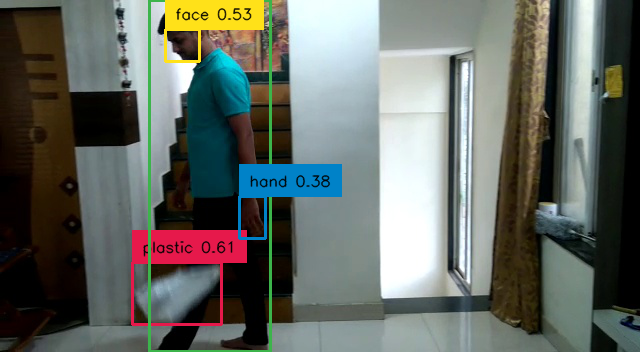

0.13731592411821175


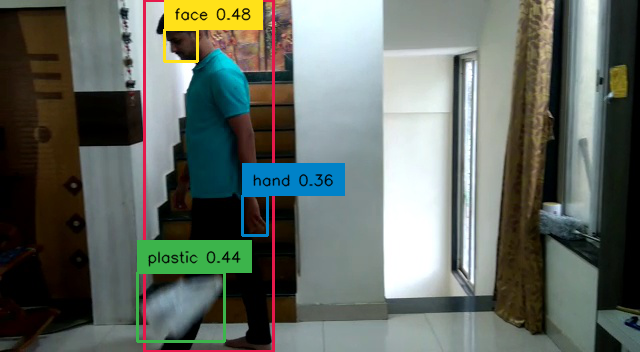

0.1714616215150319


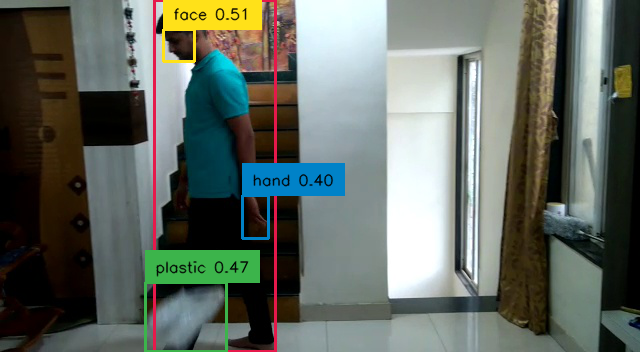

0.17844189262662055
hello


In [ ]:
import cv2
import os
import glob
import math
from groundingdino.util.inference import load_model, load_image, predict, annotate
from google.colab.patches import cv2_imshow

model = load_model("/content/drive/MyDrive/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "/content/drive/MyDrive/GroundingDINO/weights/best.pth")

def FrameCapture(path, output_dir):
    # Path to video file
    vidObj = cv2.VideoCapture(path)

    # Used as counter variable
    count = 0

    # checks whether frames were extracted
    success = 1

    while success:
        # vidObj object calls read function extract frames
        success, image = vidObj.read()
        if success:
            # Saves the frames with frame-count
            frame_path = os.path.join(output_dir, f'frame{count:04d}.jpg')
            cv2.imwrite(frame_path, image)

            count += 1
        else:
            break

    # Release the video capture object
    vidObj.release()
FrameCapture('/content/drive/MyDrive/test/test-plastic.mp4','/content/drive/MyDrive/frames')
def main():
    IMAGE_FOLDER_PATH = '/content/drive/MyDrive/frames/'
    # Get a list of all JPG files in the folder
    jpg_files = glob.glob(IMAGE_FOLDER_PATH + "*.jpg")
    TEXT_PROMPT = "hand . plastic . face . human ."
    BOX_THRESHOLD = 0.35
    TEXT_THRESHOLD = 0.25
    for i in range(len(jpg_files)-1):
        image_path = jpg_files[i]
        image_next_path = jpg_files[i+1]
        image_source, image = load_image(image_path)
        image_next_source, image_next = load_image(image_next_path)

        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )
        boxes_next, logits_next, phrases_next = predict(
            model=model,
            image=image_next,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Find the center of the hand and plastic
        hand_center = None
        plastic_center = None
        for box, phrase in zip(boxes, phrases):
            if phrase == "hand":
                hand_center = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
                # print('hand_center',hand_center)
            elif phrase == "plastic":
                plastic_center = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
                # print("plastic_center",plastic_center)

        # Calculate the distance between the hand center and plastic center using the distance formula
        if hand_center is not None and plastic_center is not None:
            distance = math.sqrt((hand_center[0] - plastic_center[0])**2 + (hand_center[1] - plastic_center[1])**2)
            # print(distance)
            # Check if the distance is greater than a certain threshold
            if distance > 0.1084: # Change this value as needed
                annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
                cv2_imshow(annotated_frame)
                print(distance)

    print('hello')

main()
